CS 282 (Computer Vision) <br>
Programming Assignment 1 <br>
OpenCV Exercises <br>
Image Enhancement <br>

Professor: Dr. Prospero C. Naval Jr. <br>
Student: Deomary Angelo B. Franco, 202322049 <br>


In [1]:
import cv2
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import platform


logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(message)s'
)

logging.info("OpenCV version: %s", cv2.__version__)
logging.info("Operating Systme: %s", platform.platform())

2026-02-10 19:46:26,375 - OpenCV version: 4.11.0
2026-02-10 19:46:26,375 - Operating Systme: macOS-26.2-arm64-arm-64bit


# Item 1
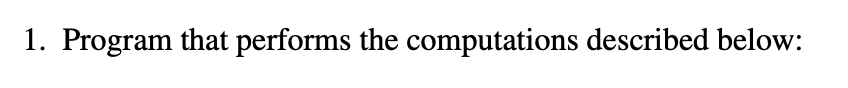

## (a)
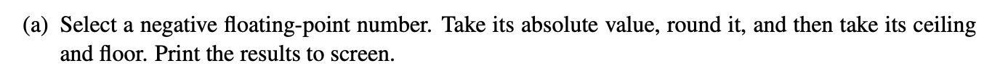

In [2]:
negative_floating_point_number = -2.72
logging.info(f'Negative floating point number: {negative_floating_point_number}')

absolute_value = cv2.absdiff(negative_floating_point_number, 0.0)[0][0]
logging.info(f'Absolute value: {absolute_value}')

ceiling_value = cv2.convertScaleAbs(negative_floating_point_number)[0][0]
logging.info(f'Ceiling value: {ceiling_value}')

floor = ceiling_value - 1
logging.info(f'Floor value: {floor}')

2026-02-10 19:46:26,379 - Negative floating point number: -2.72
2026-02-10 19:46:26,380 - Absolute value: 2.72
2026-02-10 19:46:26,380 - Ceiling value: 3
2026-02-10 19:46:26,380 - Floor value: 2


## (b)
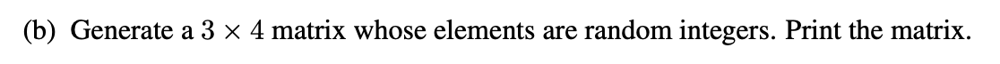

In [3]:
matrix_3x4 = cv2.randu(np.ones((3, 4), dtype=np.uint8), 0, 100)
logging.info(f'3x4 Matrix:\n{matrix_3x4}')
logging.info(f'Matrix shape: {matrix_3x4.shape}')
logging.info(f'Matrix data type: {matrix_3x4.dtype}')

2026-02-10 19:46:26,384 - 3x4 Matrix:
[[ 6 97 39 29]
 [97 10 86 93]
 [76 29 51 38]]
2026-02-10 19:46:26,385 - Matrix shape: (3, 4)
2026-02-10 19:46:26,386 - Matrix data type: uint8


## (c)
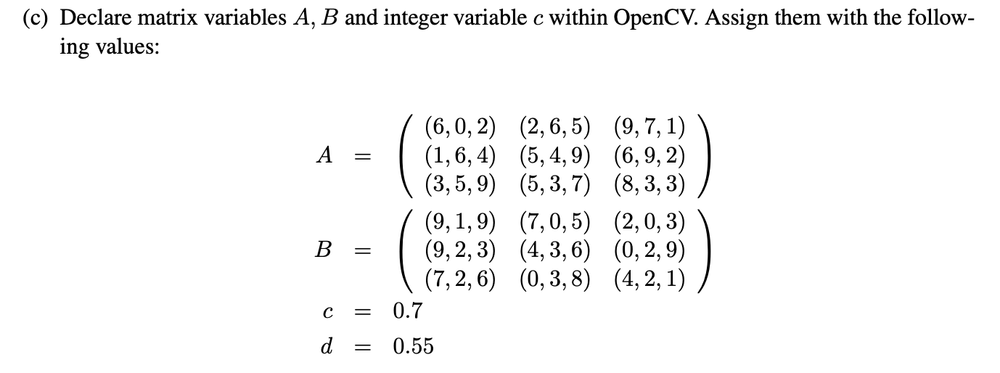

In [4]:
A_ = np.array([
    [[6, 0, 2], [2, 6, 5], [9, 7, 1]],
    [[1, 6, 4], [5, 4, 9], [6, 9, 2]],
    [[3, 5, 9], [5, 3, 7], [8, 3, 3]],
], dtype=np.float32)

A = cv2.Mat(A_)
logging.info(f'3x3x3 Matrix A:\n{A}')

B_ = np.array([
    [[9, 1, 9], [7, 0, 5], [2, 0, 3]],
    [[9, 2, 3], [4, 3, 6], [0, 2, 9]],
    [[7, 2, 6], [0, 3, 8], [4, 2, 1]],
], dtype=np.float32)

B = cv2.Mat(B_)
logging.info(f'3x3x3 Matrix B:\n{B}')

c = 0.7
d = 0.55

b_ = np.array([
    [3, 5, 5],
    [7, 2, 8],
    [4, 1, 6]
], dtype=np.float32)
b = cv2.Mat(b_)
logging.info(f'3x3x3 Matrix b:\n{b}')

2026-02-10 19:46:26,390 - 3x3x3 Matrix A:
[[[6. 0. 2.]
  [2. 6. 5.]
  [9. 7. 1.]]

 [[1. 6. 4.]
  [5. 4. 9.]
  [6. 9. 2.]]

 [[3. 5. 9.]
  [5. 3. 7.]
  [8. 3. 3.]]]
2026-02-10 19:46:26,391 - 3x3x3 Matrix B:
[[[9. 1. 9.]
  [7. 0. 5.]
  [2. 0. 3.]]

 [[9. 2. 3.]
  [4. 3. 6.]
  [0. 2. 9.]]

 [[7. 2. 6.]
  [0. 3. 8.]
  [4. 2. 1.]]]
2026-02-10 19:46:26,391 - 3x3x3 Matrix b:
[[3. 5. 5.]
 [7. 2. 8.]
 [4. 1. 6.]]


### i
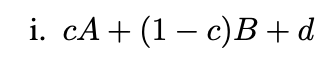

In [5]:
weighted_sum = cv2.addWeighted(A, c, B, 1-c, d)
logging.info(f'\ni. \nThe weighed sum is: \n {weighted_sum}')

2026-02-10 19:46:26,395 - 
i. 
The weighed sum is: 
 [[[7.45 0.85 4.65]
  [4.05 4.75 5.55]
  [7.45 5.45 2.15]]

 [[3.95 5.35 4.25]
  [5.25 4.25 8.65]
  [4.75 7.45 4.65]]

 [[4.75 4.65 8.65]
  [4.05 3.55 7.85]
  [7.35 3.25 2.95]]]


### ii
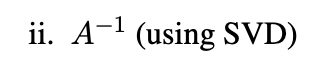

In [6]:
inverses = []
for _a in cv2.split(A_):
    w, u, vt = cv2.SVDecomp(_a)
    inv_a = vt.T @ np.diag(1 / w[:, 0]) @ u.T
    inverses.append(inv_a)

inverse_A = cv2.merge(inverses)
logging.info(f'\nii. \nThe inverse of A, when using SVD, is: \n {inverse_A}')

2026-02-10 19:46:26,398 - 
ii. 
The inverse of A, when using SVD, is: 
 [[[-1.0000005e+00 -1.0135134e-01  4.3333316e+00]
  [-2.9000010e+00  2.0270295e-02 -2.6666656e+00]
  [ 3.3000014e+00  1.7567565e-01  3.3333322e-01]]

 [[-1.0000002e+00  1.8243243e-01  1.9999992e+00]
  [-2.1000006e+00 -2.3648646e-01 -9.9999946e-01]
  [ 2.7000008e+00  2.8378376e-01 -6.2145446e-08]]

 [[ 1.0000002e+00 -1.3513520e-02 -1.7666660e+01]
  [ 2.4000006e+00  2.0270269e-01  1.0333329e+01]
  [-2.8000009e+00 -2.4324326e-01 -6.6666621e-01]]]


Since A is a tensor having a 3rd dimension (the channel dimension), the operation is performed for each channel and then combined later. The same logic is also applied to the other tasks.

### iii
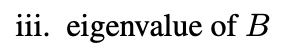

In [7]:
eigen_values = []
for _b in cv2.split(B_):
    _, eigen_value, eigen_vector = cv2.eigen(_b)
    eigen_values.append(eigen_value)

eigen_values_B = cv2.merge(eigen_values)
logging.info(f'\niii. \nThe eigenvalue of B is: \n {eigen_values_B}')

2026-02-10 19:46:26,402 - 
iii. 
The eigenvalue of B is: 
 [[[14.197403    4.561553   17.032358  ]]

 [[ 3.9999998   1.          4.8394666 ]]

 [[-1.1974022   0.43844712 -5.8718247 ]]]


### iv
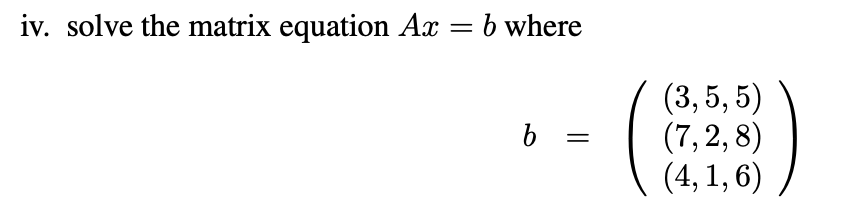

In [8]:
solutions = []
for _a in cv2.split(A_):
    _, sol = cv2.solve(_a, b)

    solutions.append(sol)

x = cv2.merge(solutions)
logging.info(f'\niv. \nThe solution x is: \n {x}')

2026-02-10 19:46:26,407 - 
iv. 
The solution x is: 
 [[[-1.0099999e+01  5.4054052e-01 -4.3333330e+00]
  [-7.4999986e+00 -2.9054055e-01  1.6666664e+01]
  [-8.3999987e+00  7.0945948e-01  2.3333323e+00]]

 [[-6.8999996e+00  2.7027031e-02 -9.9999958e-01]
  [-6.4999990e+00  7.2297305e-01  7.9999981e+00]
  [-5.5999994e+00  7.2297293e-01  1.9999995e+00]]

 [[ 8.5999994e+00  4.0540540e-01  1.6666664e+01]
  [ 6.9999990e+00  9.4594568e-02 -6.8333321e+01]
  [ 7.3999991e+00  9.4594628e-02 -9.6666622e+00]]]


## (d)
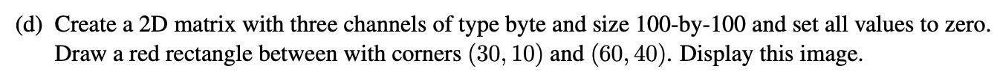

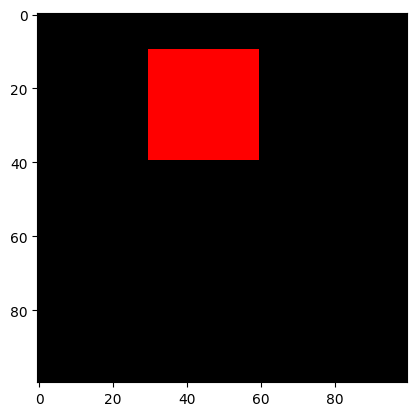

In [9]:
base_ = np.zeros((100, 100, 3), 
                 dtype=np.uint8)
base = cv2.Mat(base_)
base[10:40, 30:60, 0] = 255 

plt.imshow(base);

A red square is displayed in the image whose vertices lie  on (30, 10), (60, 10), (30, 40), and (60, 40). The red square is composed pof pixels having channel values of (255, 0, 0).

## (e)
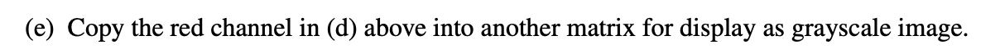

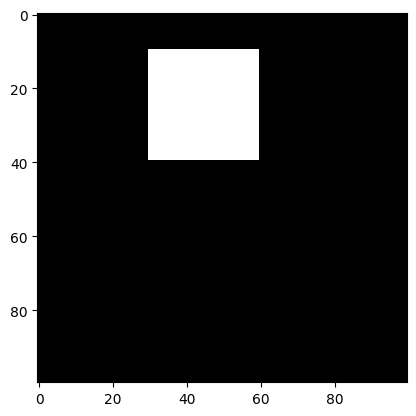

In [16]:

base = cv2.cvtColor(base_, cv2.COLOR_BGR2GRAY)
plt.imshow(base, cmap='gray');

This is the same image as above but turned grayscale. The original tensor is turned to a matrix where it only has 1 channel (0 pertaining to black and 255 pertaining to white). This is the reason why the square is now white.

# Item 2
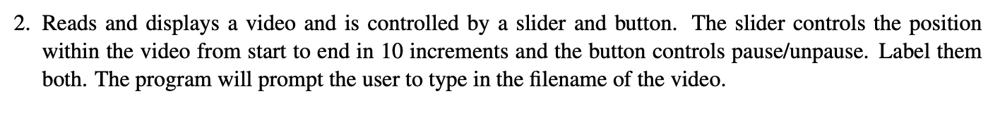

In [17]:
# main logic of the code is contained in the src/video_player.py file
!python src/video_player.py "PA1-Image_Enhancement/cute_dog.mp4"

Sample screenshot  
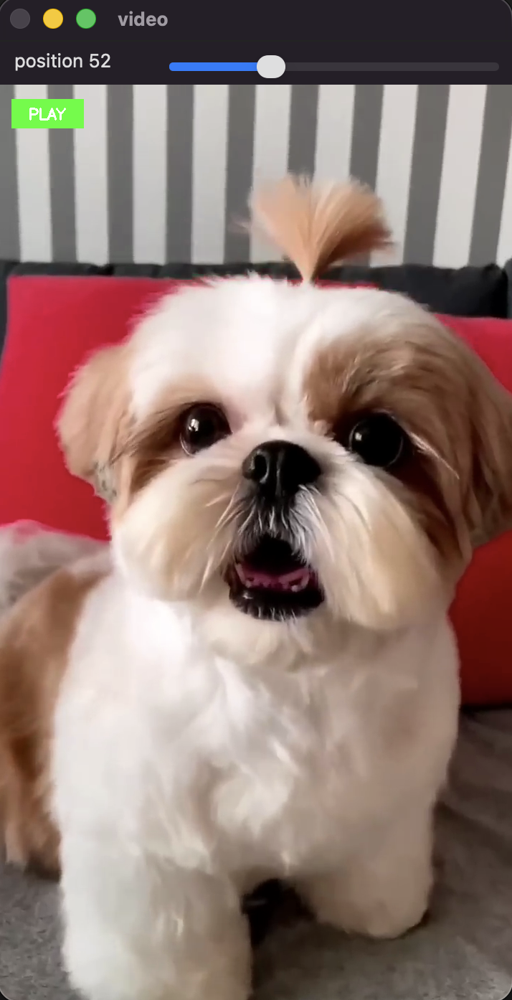 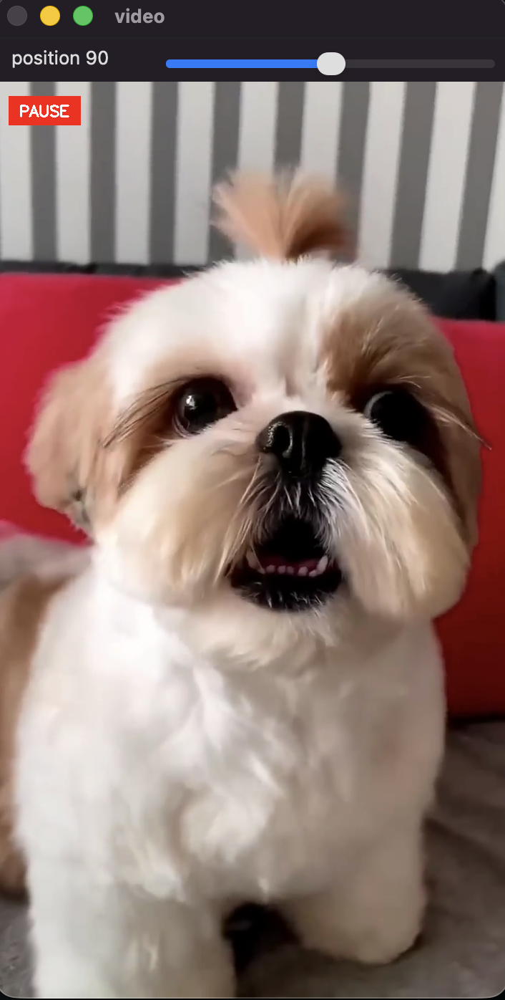

Image above are taken when running the code. When running the program inside the notebook, there is an issue where the program cannot be stopped, hence the program is being run by calling the code instead. The same goes for Item 3 and 4.

The selected video here to demonstrate the code is another video downloaded externally. We can slide the slider to go to a specific frame in the video, and at the same time toggle the play/pause button to continue running the video or freezing it.

# Item 3
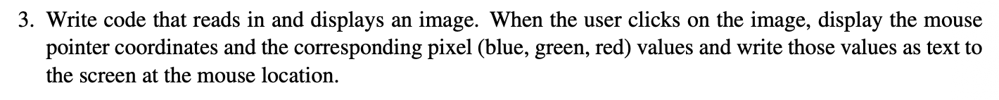

In [19]:
# main logic of the code is contained in the src/image_clicker.py file
!python src/image_clicker.py "PA1-Image_Enhancement/momandkids.jpg"

2026-02-10 19:52:02,285 - Loading image from: PA1-Image_Enhancement/momandkids.jpg
2026-02-10 19:52:02,382 - Click on the image to see coordinates and pixel values. Press any key to close.
2026-02-10 19:52:03,690 - Coordinates: (308, 216), BGR: (81, 81, 81)


Sample screenshot  
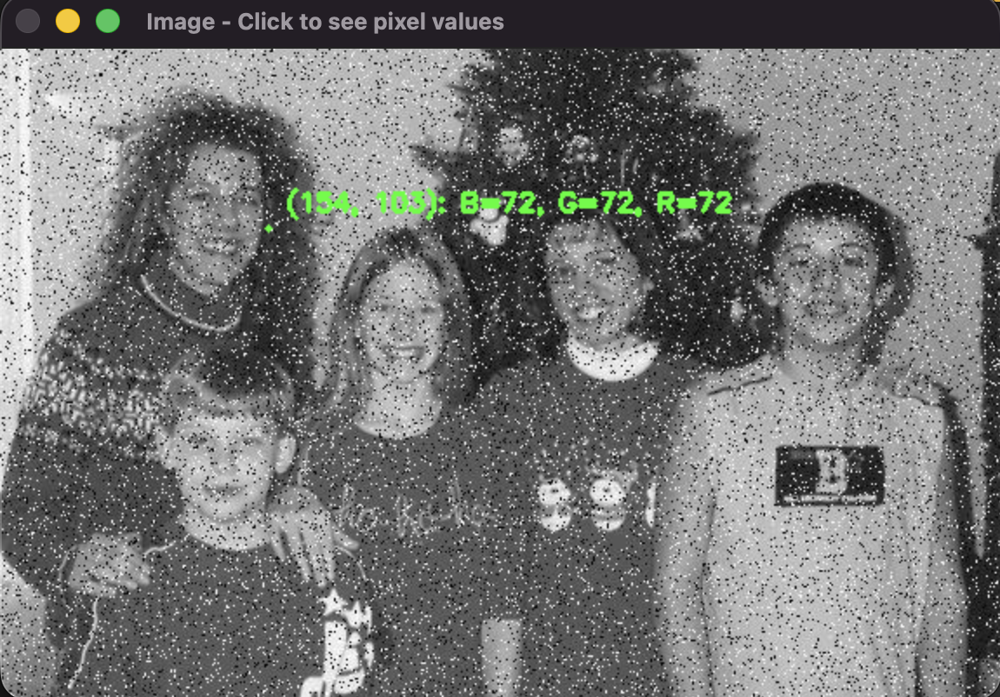

The selected image for this task is the the momandkids.jpg. Here when running the program, it opens it in a new window where the user can click anywhere within the image and the coordinates and RGB value of the clicked pixel will then display.

# Item 4
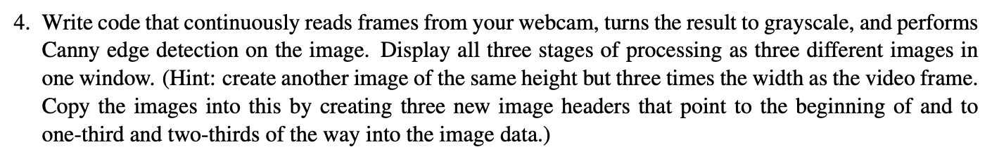

In [20]:
# main logic of the code is contained in the src/grayscale_canny_edge.py file
!python src/grayscale_canny_edge.py

2026-02-10 19:52:17,584 - Webcam opened. Press 'q' to quit.
2026-02-10 19:53:23,172 - Webcam closed.


Sample screenshot  
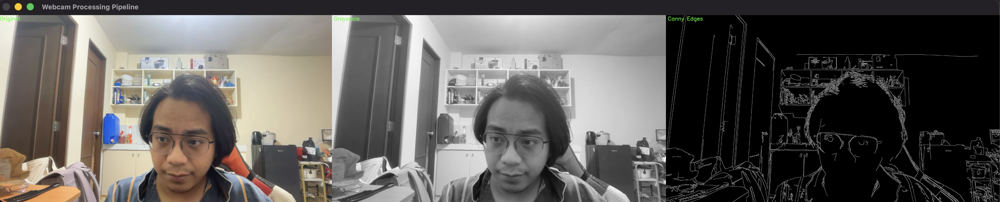
The code can be run so that a video opened via the webcam will appear where this video has 3 components, the original video, the grayscale video, and the canny edge detector video. 

# Item 5
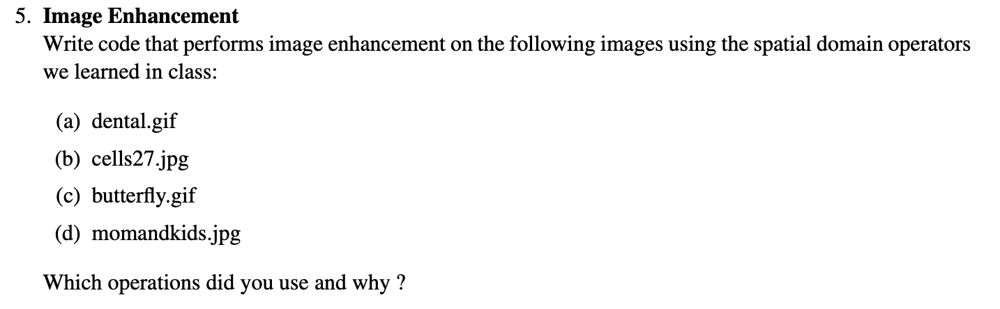

## a) dental.gif

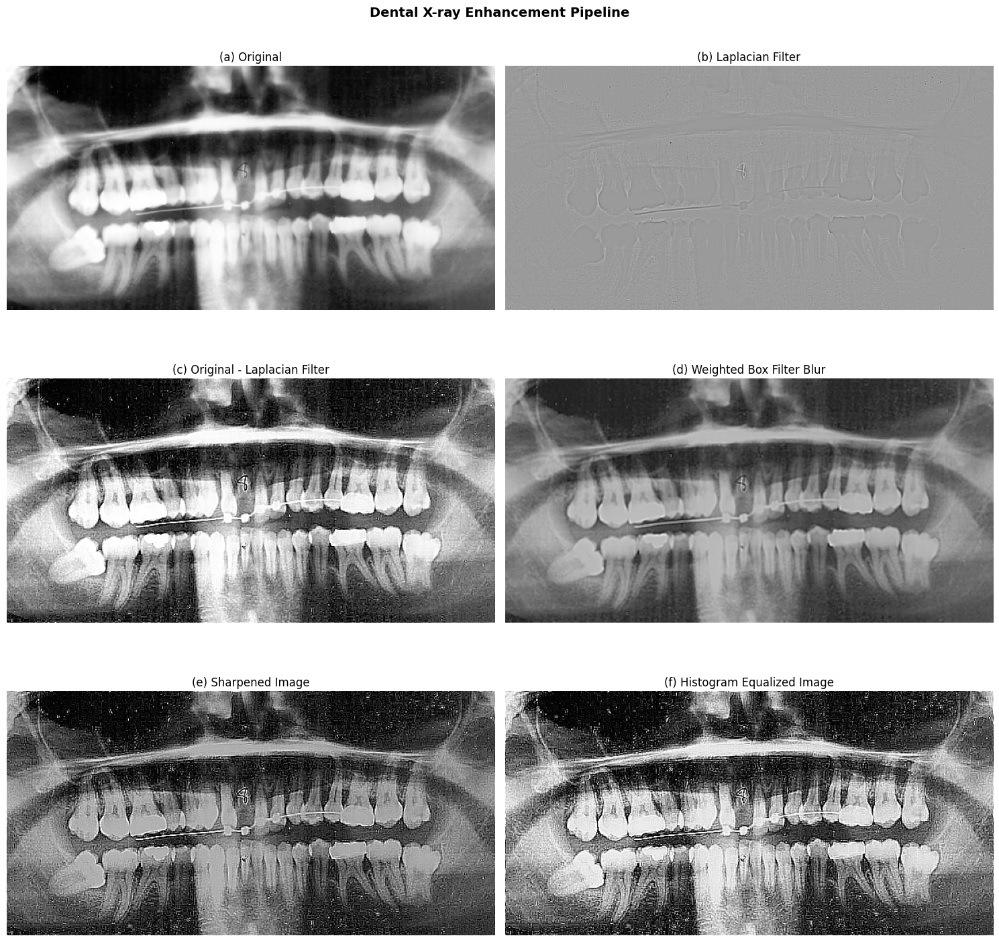

In [14]:
path = 'PA1-Image_Enhancement/dental.gif'

# Extract frame from GIF using VideoCapture
cap = cv2.VideoCapture(path)
ret, frame = cap.read()
cap.release()

laplacian_filter = np.array([[1, 1, 1],
                             [1, -8, 1],
                             [1, 1, 1]], dtype=np.float64)

a = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float64)
b = cv2.filter2D(a, cv2.CV_64F, laplacian_filter)
c_raw = a - b
c = np.clip(c_raw, 0, 255).astype(np.uint8)
d = cv2.filter2D(c_raw, cv2.CV_64F, np.ones((3, 3), dtype=np.float64) / 9)
e = cv2.addWeighted(c_raw, 1.7, d, -1, 0)
e = np.clip(e, 0, 255).astype(np.uint8)
f = cv2.equalizeHist(e)


steps = {
    '(a) Original': a,
    '(b) Laplacian Filter': b,
    '(c) Original - Laplacian Filter': c,
    '(d) Weighted Box Filter Blur': d,
    '(e) Sharpened Image': e,
    '(f) Histogram Equalized Image': f
}

fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.ravel()

for idx, (title, img) in enumerate(steps.items()):
    axes[idx].imshow(img, cmap='gray')
    axes[idx].set_title(title, fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Dental X-ray Enhancement Pipeline', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

The dental image undergoes a series of transformation. First the laplacian filter is computed and subtracted from the original image. A weighted box filter blur is then applied to smoothen it, and then sharpened again using high boost filter (where the blurred image is subtracted from the (c)), and then lastly the histogram equalizer is applied. The reason for this is to sharpen the edges of the teeth image and to visualize more the opacity within the teeth as these are the most important elements of the xray.

## b) cells27.jpg

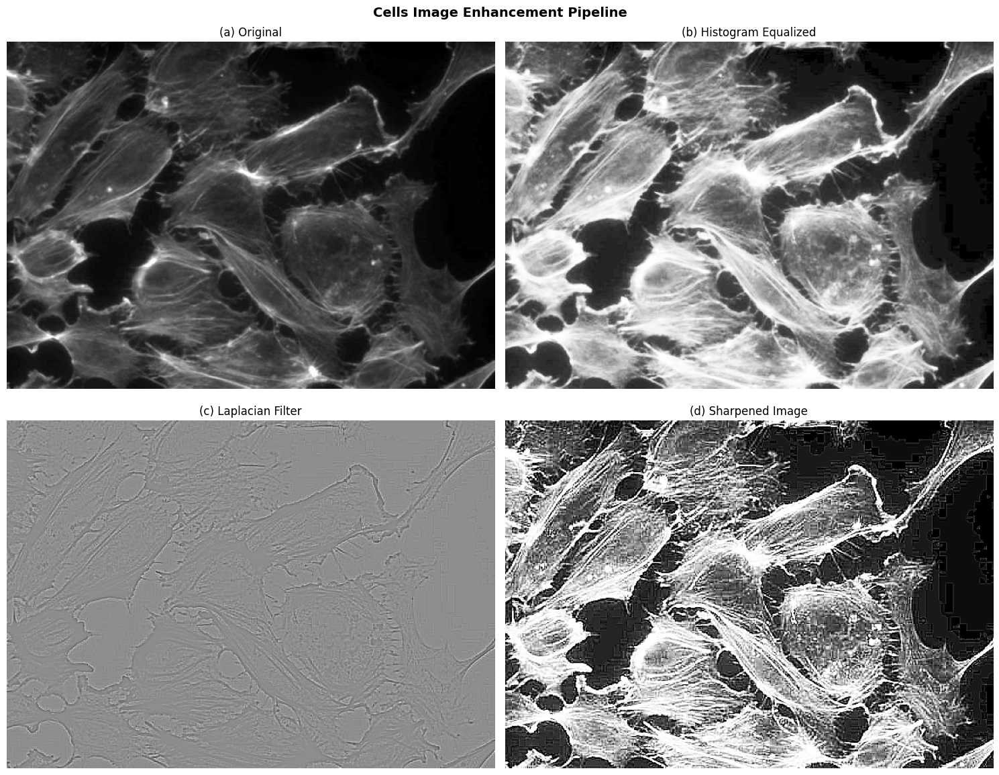

In [15]:
path = 'PA1-Image_Enhancement/cells27.jpg'

frame = cv2.imread(path)

laplacian_filter = np.array([[1, 1, 1],
                             [1, -8, 1],
                             [1, 1, 1]], dtype=np.float64)

a = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float64)
b = cv2.equalizeHist(a.astype(np.uint8)).astype(np.float64)
c = cv2.filter2D(b, cv2.CV_64F, laplacian_filter)
d_raw = b - c
d = np.clip(d_raw, 0, 255).astype(np.uint8)



steps = {
    '(a) Original': a,
    '(b) Histogram Equalized': b,
    '(c) Laplacian Filter': c,
    '(d) Sharpened Image': d,
}

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

for idx, (title, img) in enumerate(steps.items()):
    axes[idx].imshow(img, cmap='gray')
    axes[idx].set_title(title, fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Cells Image Enhancement Pipeline', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Histogram equalizer is first applied and then sharpened by removing the laplacian filter. With this, we can see that the cell images are being enveloped by some light layer. This layer is originally hard to see in the original image.

## c) butterfly.gif

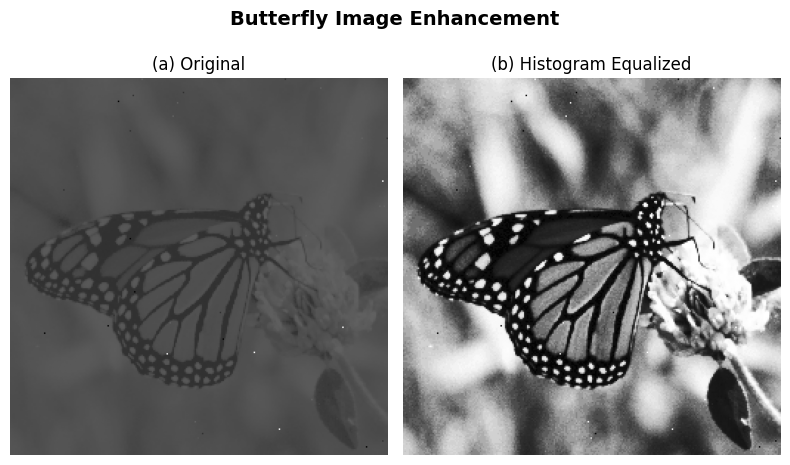

In [16]:
path = 'PA1-Image_Enhancement/butterfly.gif'

cap = cv2.VideoCapture(path)
ret, frame = cap.read()
cap.release()

a = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
b = cv2.equalizeHist(a.astype(np.uint8)).astype(np.float64)


steps = {
    '(a) Original': a,
    '(b) Histogram Equalized': b,
}

fig, axes = plt.subplots(1, 2, figsize=(8, 5))
axes = axes.ravel()

for idx, (title, img) in enumerate(steps.items()):
    axes[idx].imshow(img, cmap='gray')
    axes[idx].set_title(title, fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Butterfly Image Enhancement', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

A simple histogram equalizer is applied here to add contrast to the image. With this, we can see the background much clearly and the butterfly's wings are emphasized much better.

## d) momandkids.jpg

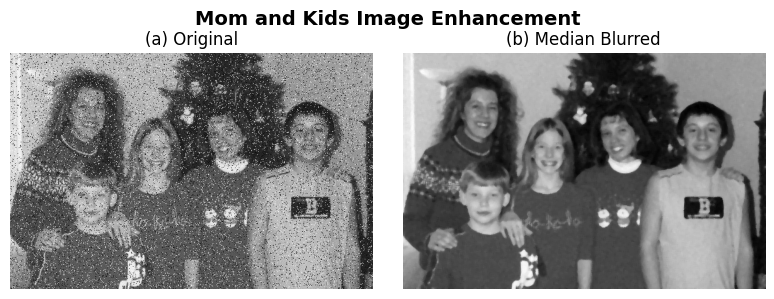

In [17]:
path = 'PA1-Image_Enhancement/momandkids.jpg'

frame = cv2.imread(path)

a = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float64)
b = cv2.medianBlur(a.astype(np.uint8), 5).astype(np.float64)

steps = {
    '(a) Original': a,
    '(b) Median Blurred': b,

}

fig, axes = plt.subplots(1, 2, figsize=(8, 3))
axes = axes.ravel()

for idx, (title, img) in enumerate(steps.items()):
    axes[idx].imshow(img, cmap='gray')
    axes[idx].set_title(title, fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Mom and Kids Image Enhancement', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
    

The original image has grainy noise artifacts, and therefore, the best way to remove this is by using median blur. Median blur checks for the neighboring pixels and removes any "outlier" pixel values.

# Item 6
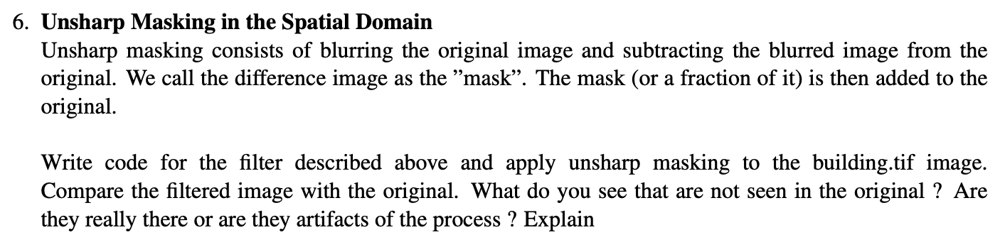

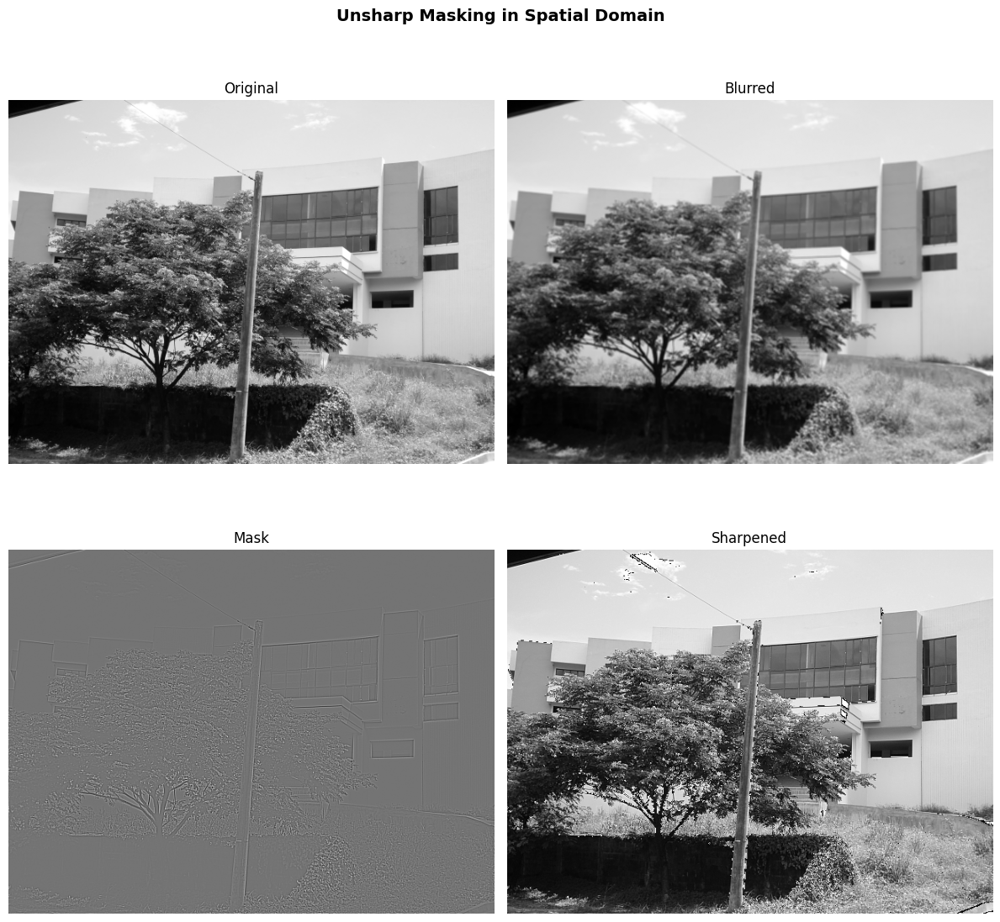

In [18]:
path = 'PA1-Image_Enhancement/building.tif'
cap = cv2.VideoCapture(path)
ret, frame = cap.read()
cap.release()


original = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float64)
blur = cv2.filter2D(original, cv2.CV_64F, np.ones((3, 3), dtype=np.float64) / 9)
mask = original - blur
sharpened = original + mask
sharpened = sharpened.astype(np.uint8)

steps = {
    'Original': original,
    'Blurred': blur,
    'Mask': mask,
    'Sharpened': sharpened
}

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.ravel()

for idx, (title, img) in enumerate(steps.items()):
    axes[idx].imshow(img, cmap='gray')
    axes[idx].set_title(title, fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Unsharp Masking in Spatial Domain', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
    

As observed in the sharpened image, there are certain artifacs that are not present in the original image. Some of these are the black spots such as those found around the clouds, he upper-left and upper right portion of the building, along the length of the pole, and in the edges of some parts of the building. Essentially, these are most common along image edes. This can be attributed by the fact that during blurring, some pixel value at (x, y) gets increased and becomes much higher when compared to the original pixel value. These then when being subtracted from the original image provides a negative value for the mask. If this negative mask value has a higher absolute value when compared to the original image, the resulting pixel value still remains negative. Finally, these will be clipped to 0, resulting in what we see as black spots. 

Therefore, image edges with abrupt pixel value changes have a higher tendency to experiece black spot artifacts.

# Item 7
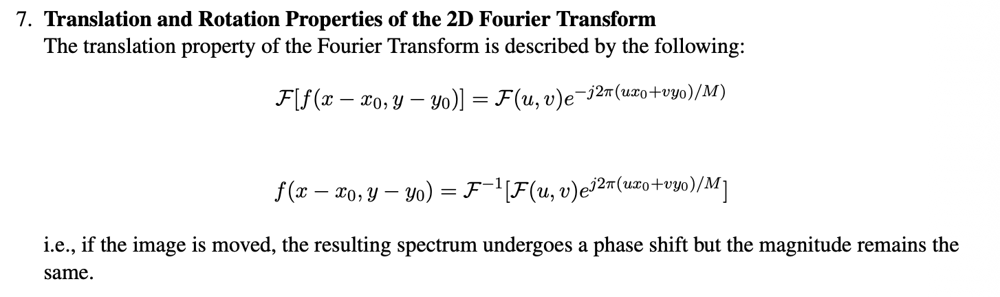
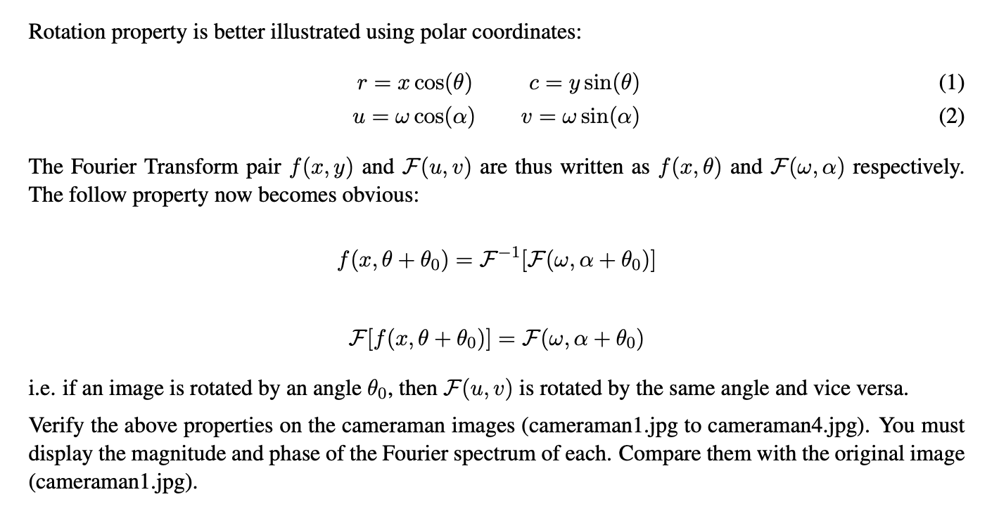

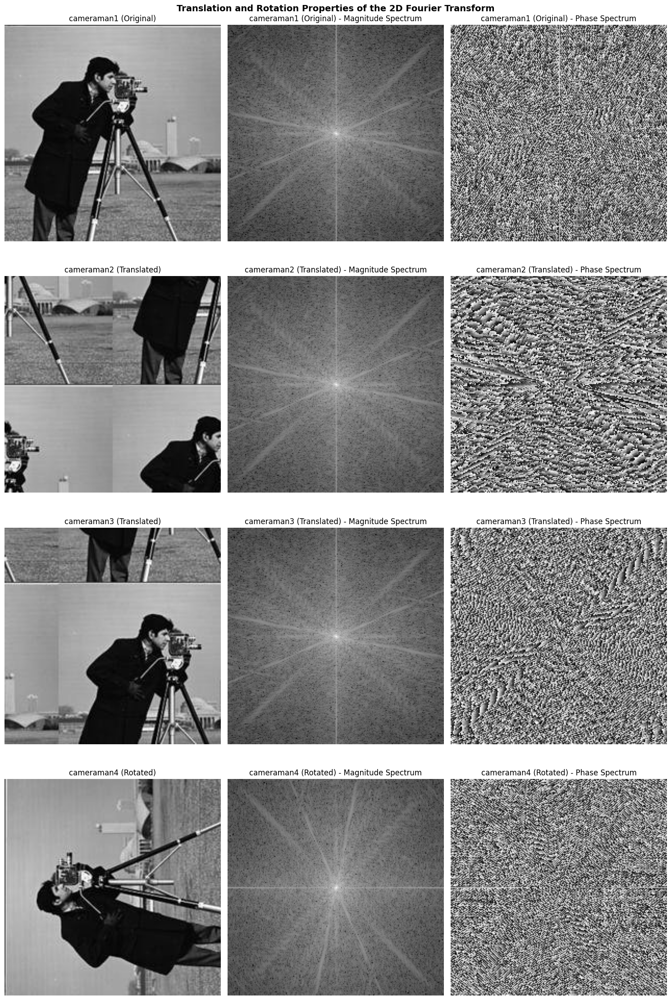

In [21]:
images = {}
for i in range(1, 5):
    path = f'PA1-Image_Enhancement/cameraman{i}.jpg'
    images[f'cameraman{i}'] = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

# Compute FFT, magnitude spectrum, and phase spectrum for each
fft_data = {}
for name, img in images.items():
    f = cv2.dft(np.float64(img), flags = cv2.DFT_COMPLEX_OUTPUT)
    fshift = np.fft.fftshift(f)
    magnitude, phase = cv2.cartToPolar(fshift[:,:,0], fshift[:,:,1])
    magnitude = np.log(magnitude) * 20
    fft_data[name] = {'magnitude': magnitude, 'phase': phase}

# Display: 4 rows (one per image) x 3 columns (original, magnitude, phase)
fig, axes = plt.subplots(4, 3, figsize=(15, 23))

titles = [
    'cameraman1 (Original)',
    'cameraman2 (Translated)',
    'cameraman3 (Translated)',
    'cameraman4 (Rotated)',
]

for idx, (name, img) in enumerate(images.items()):
    axes[idx, 0].imshow(img, cmap='gray')
    axes[idx, 0].set_title(f'{titles[idx]}', fontsize=12)
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(fft_data[name]['magnitude'], cmap='gray')
    axes[idx, 1].set_title(f'{titles[idx]} - Magnitude Spectrum', fontsize=12)
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(fft_data[name]['phase'], cmap='gray')
    axes[idx, 2].set_title(f'{titles[idx]} - Phase Spectrum', fontsize=12)
    axes[idx, 2].axis('off')

plt.suptitle('Translation and Rotation Properties of the 2D Fourier Transform',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

As observed, images cameraman1, cameraman2, and cameraman3 have the same magnitude spectrum. These can be verified visually as the white lines have the same angle orientation. However, the phase spectrum are quite different from each other. The images agrees with the statement that a translated image maintains their magnitude spectrum.  

The last image cameraman4 is also the same image as cameraman1 but rotated 90 degrees counter-clockwise. As observed, the corresponding magnitude and phase spectrum plot is also rotated 90 degrees coutner-clockwise. This agrees with the rotation property of a Fourier Transform.